# Office Data Visualization

Load the cleaned data from `../data/clean` and visualize it.

In [1]:
import pandas as pd
import plotly.graph_objs as go
import util
import datetime as dt

Define events of interest by their dates....

In [2]:
events = {
    'Insulation Installed': dt.datetime(month=3, day=13, year=2020, hour=14)
}

In [3]:
sensor_data = pd.read_csv('../data/clean/sensor_data.csv')
sensor_data.astype({'location': 'int32'})
sensor_data.head()

/home/sbowman/miniconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3058: DtypeWarning:

Columns (1) have mixed types. Specify dtype option on import or set low_memory=False.



,relative_humidity,temperature_celsius,timestamp,location
0,36.4,7.6,2019-11-09 15:30:00,1
1,36.5,7.6,2019-11-09 15:31:00,1
2,36.8,7.6,2019-11-09 15:32:00,1
3,36.9,7.6,2019-11-09 15:33:00,1
4,37.6,7.6,2019-11-09 15:34:00,1


Let's only just look at the most recent four weeks of data.

In [4]:
last_timestamp = pd.Timestamp(sensor_data.timestamp.tolist()[-1])
four_weeks_ago = last_timestamp - pd.Timedelta('28.0 days')
# print(four_weeks_ago)
last_month_sensor_data = sensor_data[(pd.to_datetime(sensor_data.timestamp) > four_weeks_ago)]

exterior_data = last_month_sensor_data[last_month_sensor_data.location==util.Locations.EXTERIOR.value]
interior_data = last_month_sensor_data[last_month_sensor_data.location==util.Locations.INTERIOR.value]

In [5]:
def build_plot(exterior_data:pd.DataFrame, interior_data:pd.DataFrame, plot_parameter:str=None):
    exterior_scatter = go.Scatter(
        x=exterior_data.timestamp,
        y=exterior_data[plot_parameter],
        line={'color':'blue'},
        mode='lines',
        name='exterior'
    )
    interior_scatter = go.Scatter(
        x=interior_data.timestamp,
        y=interior_data[plot_parameter],
        line={'color':'red'},
        name='interior'
    )
    
    traces = [exterior_scatter, interior_scatter]
    min_max = [min(exterior_data[plot_parameter].min(),interior_data[plot_parameter].min()), 
               max(exterior_data[plot_parameter].max(),interior_data[plot_parameter].max())]
    for event_name, event_dt in events.items():
        traces.append(
            go.Scatter(
                y=min_max,
                x=[event_dt, event_dt],
                name=event_name,
                text=event_name,
                line=dict(dash='dash'),
                mode='lines+markers'
            )
        )
    
    fig = go.Figure(traces)
    fig.layout.template = 'plotly_dark'
    return fig


## Temperature

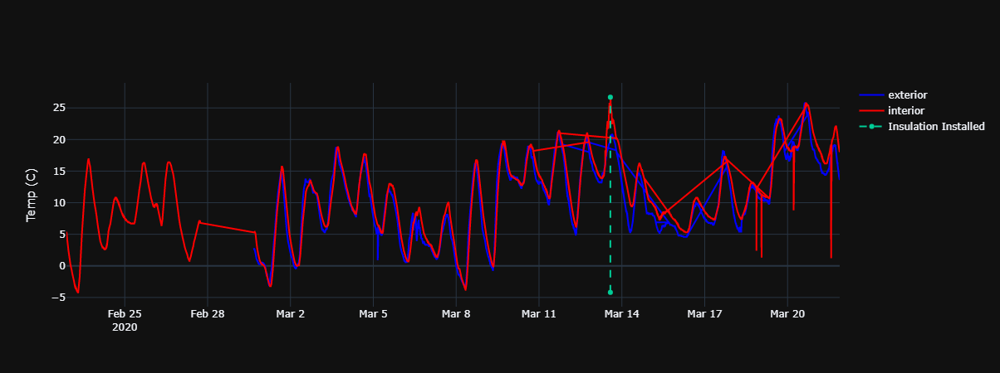

In [8]:
fig = build_plot(exterior_data=exterior_data, interior_data=interior_data, plot_parameter='temperature_celsius')
fig.layout.yaxis = {'title': 'Temp (C)'}
fig.show()


From the above plot I see the following:
* The building, of itself, behaves like a high frequency filter. Which is to say, it smooths out the high frequency temperature fluctuations that are occurring each day. This is clearly true before and after the insulation event.
* Prior to insulation installation, the large scale changes in exterior temperature are clearly reflected in the interior temperature. However, we observe also a time delay. The inside of the building achieves the same maximums and minimums, but usually offset by an hour or so. The building appears to largely have the same temperature-time derivatives. 
* After the insulation, the building has a more obvious change in the derivatives. In general, the derivates are damped such that the heating-up and cooling-down actions occur more slowly. And, the minima and maxima are not necessarily the same as the exterior. This is a reasonable & expected result of insulation. And unlike when it had no insulation, the building now sometimes starts the sunlight hours at a warmer temperature outside yet stays cooler as the exterior air warms quickly (e.g. May 17, 2020). Sometimes, the interior never reacahes the exterior maximum. However, the response is not always a simple damping function. See 21 May in which the behavior exhibited a cool-down rate very similar to the exterior and then heated up during the morning in a similar way the outside, always staying well above the outside temperature for the entire day. In this case, the damping we less obvious and the profile was more of an offset in which the interior temperature was quite a bit warmer.


## Relative Humidity

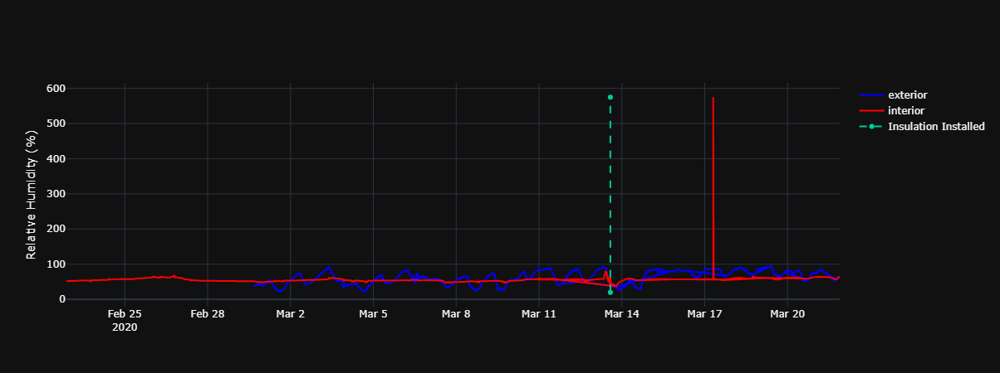

In [7]:
fig = build_plot(exterior_data=exterior_data, interior_data=interior_data, plot_parameter='relative_humidity')
fig.layout.yaxis = {'title': 'Relative Humidity (%)'}
fig.show()
